In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import os

import imageio.v2 as imageio
import IPython
from IPython.display import display
from IPython.display import Image
from IPython.display import HTML
from PIL import Image
from mpl_toolkits.mplot3d import Axes3D

from astroquery.ipac.nexsci.nasa_exoplanet_archive import NasaExoplanetArchive
import random

import astropy.units as u
import astropy.constants as const

import shutil

In [2]:
# Global variables
GRAV_CONSTANT = const.G.value
SEC_PER_DAY = 86400

In [3]:
# Classes
class HeavenlyBody:
    def __init__(self, name, color, mass, radius, position, velocity):
        self.name = name
        self.color = color
        self.mass = mass
        self.radius = radius
        self.position = position
        self.velocity = velocity
    
    def get_radii_ratio(self, other_body):
        return self.radius/other_body.radius
    
    def calculate_grav_force(self, other_body):
        position_difference = self.position - other_body.position
        r = np.linalg.norm(position_difference)
        force = -GRAV_CONSTANT*(self.mass*other_body.mass)/r**2
        return force*position_difference/r
    
    def update_orbit(self, other_body, dt):
        force = self.calculate_grav_force(other_body)
        self.velocity = (force/self.mass)*dt + self.velocity
        self.position = self.velocity*dt + self.position

In [4]:
# Functions
def calculate_orbital_period(star, planet):
    orbit = int(2*np.pi*np.sqrt((np.linalg.norm(planet.position)**3)/(GRAV_CONSTANT*(planet.mass + star.mass)))/SEC_PER_DAY)
    return orbit

def calculate_orbital_velocity(star, planet):
    velocity = 2*np.pi*np.linalg.norm(planet.position)/calculate_orbital_period(star, planet)/SEC_PER_DAY
    return velocity

# Extracts stellar data from the Nasa Exoplanet Archive to create a star object
def generate_random_star():
    stellar_properties_table = NasaExoplanetArchive.query_criteria(table="ps", select="hostname, st_mass, st_rad", cache=True)
    while True:
        random_star_entry = random.choice(stellar_properties_table)

        # Check if the selected star has NaN for either radius or mass
        if np.isnan(random_star_entry['st_rad']) or np.isnan(random_star_entry['st_mass']):

            # If either radius or mass is NaN, continue to the next iteration of the loop
            continue

        # If both radius and mass are present, extract star properties and break out of the loop
        star_name = random_star_entry['hostname']
        star_mass = random_star_entry['st_mass'].to(u.kg).value
        star_radius = random_star_entry['st_rad'].to(u.m).value
        star_color = 'deepskyblue'
        break

    return HeavenlyBody(star_name, star_color, star_mass, star_radius, np.array([0, 0, 0]), np.array([0, 0, 0]))

# For longer orbits, manually overwrite dt to be larger
def simulate_orbit(star, planet, simulation_length, dt=SEC_PER_DAY):
    positions = [[star.position, planet.position]]
    for i in range(int(simulation_length)):
        star.update_orbit(planet, dt)
        planet.update_orbit(star, dt)
        positions.append([star.position, planet.position])
    return positions

# Cannot use Star with Sun as they have the same initial position
def plot_orbit(star, planet, simulation_length, dt=SEC_PER_DAY, plot_type='2D_static', save_gif=False):
    pos = simulate_orbit(star, planet, simulation_length, dt)
    planet_x = [pos[i][1][0] for i in range(len(pos))]
    planet_y = [pos[i][1][1] for i in range(len(pos))]
    planet_z = [pos[i][1][2] for i in range(len(pos))]
    star_x = [pos[i][0][0] for i in range(len(pos))]
    star_y = [pos[i][0][1] for i in range(len(pos))]
    star_z = [pos[i][0][2] for i in range(len(pos))]

    if plot_type == '2D_static':
        plt.figure(figsize=(5,5))
        plt.scatter(star_x, star_y, s=700, color=star.color)
        # Use radii ratio instead of area so that planets are visible
        plt.scatter(planet_x[0], planet_y[0], s=700*planet.get_radii_ratio(star), color=planet.color)
        plt.plot(planet_x, planet_y, linewidth = 0.7, linestyle = 'dashed', color = 'black')
        plt.xlim(-2*max(pos[0][1]), 2*max(pos[0][1]))
        plt.ylim(-2*max(pos[0][1]), 2*max(pos[0][1]))
        plt.title(f"Motion of {star.name} and {planet.name} under Gravitational Attraction")
        plt.xlabel('X Position (m)')
        plt.ylabel('Y Position (m)')
        plt.show()
    
    elif plot_type == '3D_static':
        fig = plt.figure()
        ax = fig.add_subplot(111, projection='3d')
        ax.scatter(star_x, star_y, star_z, s=700, color=star.color)
        ax.scatter(planet_x[0], planet_y[0], planet_z[0], s=700*planet.get_radii_ratio(star), color=planet.color)
        ax.plot(planet_x, planet_y, planet_z, linewidth = 0.4, color = 'black')
        ax.set_xlim(-1.5*max(pos[0][1]), 1.5*max(pos[0][1]))
        ax.set_ylim(-1.5*max(pos[0][1]), 1.5*max(pos[0][1]))
        ax.set_zlim(-1.5*max(pos[0][1]), 1.5*max(pos[0][1]))
        ax.set_xlabel('X Position')
        ax.set_ylabel('Y Position')
        ax.set_zlabel('Z Position')
        ax.set_title(f"Motion of {star.name} and {planet.name} under Gravitational Attraction")
        plt.show()

    elif plot_type in ['2D_gif', '3D_gif']:
        frames = []

        for i in range(len(pos)):
            if plot_type == '2D_gif':
                plt.figure(figsize=(5,5))
                plt.scatter(star_x[i], star_y[i], s=700, color=star.color)
                plt.scatter(planet_x[i], planet_y[i], s=700*planet.get_radii_ratio(star), color=planet.color)
                plt.xlim(-2*max(pos[0][1]), 2*max(pos[0][1]))
                plt.ylim(-2*max(pos[0][1]), 2*max(pos[0][1]))
                plt.title(f"Motion of {star.name} and {planet.name} under Gravitational Attraction")
                plt.xlabel('X Position (m)')
                plt.ylabel('Y Position (m)')
                filename = f'temp_frame_{i:03d}.png'
                plt.savefig(filename)
                frames.append(filename)
                plt.close()
            
            elif plot_type == '3D_gif':
                fig = plt.figure()
                ax = fig.add_subplot(111, projection='3d')
                ax.scatter(star_x[i], star_y[i], star_z[i], s=700, color=star.color)
                ax.scatter(planet_x[i], planet_y[i], planet_z[i], s=700*planet.get_radii_ratio(star), color=planet.color)
                ax.set_xlim(-2*max(pos[0][1]), 2*max(pos[0][1]))
                ax.set_ylim(-2*max(pos[0][1]), 2*max(pos[0][1]))
                ax.set_zlim(-2*max(pos[0][1]), 2*max(pos[0][1]))
                ax.set_xlabel('X Position')
                ax.set_ylabel('Y Position')
                ax.set_zlabel('Z Position')
                ax.set_title(f"Motion of {star.name} and {planet.name} under Gravitational Attraction")
                filename = f'temp_frame_{i:03d}.png'
                plt.savefig(filename)
                frames.append(filename)
                plt.close()

        gif_filename = f'{star.name}_{planet.name}_orbit.gif'
        with imageio.get_writer(gif_filename, mode='I', duration = 0.05) as writer:
            for filename in frames:
                image = imageio.imread(filename)
                writer.append_data(image)

        display(IPython.display.Image(gif_filename))

        # Remove temporary frames
        for filename in frames:
            os.remove(filename)

## Demostrations
In the following cells, I'll be demostrating the functions defined above.

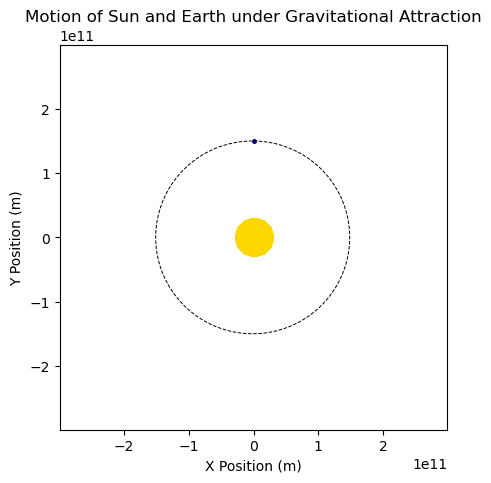

In [5]:
# Plot a 2D static orbit of the Earth around the Sun
earth_sun_period = 365
Earth = HeavenlyBody('Earth', 'darkblue', const.M_earth.value, const.R_earth.value,
                     np.array([0, const.au.value, 0]), np.array([0, 0, 0]))

Sun = HeavenlyBody('Sun', 'gold', const.M_sun.value, const.R_sun.value,
                   np.array([0, 0, 0]), np.array([0, 0, 0]))

# Calculate the initial orbital velocity of Earth
Earth.velocity = np.array([calculate_orbital_velocity(Sun, Earth), 0, 0])

plot_orbit(Sun, Earth, earth_sun_period)

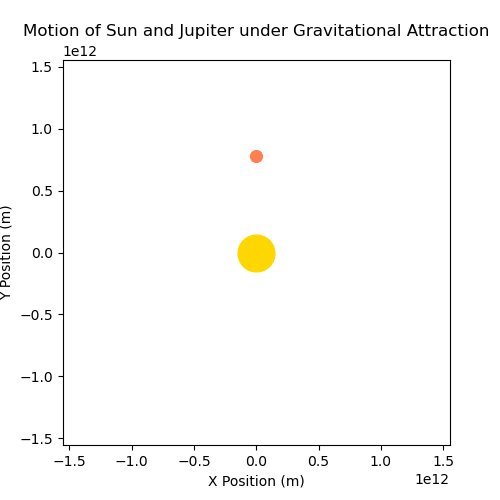

In [6]:
# Plot a 2D gif of the orbit of Jupiter around the Sun
jupiter_sun_period = 4333
Jupiter = HeavenlyBody('Jupiter', 'coral', const.M_jup.value, const.R_jup.value,
                       np.array([0, 5.2*const.au.value, 0]), np.array([0, 0, 0]))

Sun = HeavenlyBody('Sun', 'gold', const.M_sun.value, const.R_sun.value,
                   np.array([0, 0, 0]), np.array([0, 0, 0]))

# Calculate the initial orbital velocity of Jupiter
Jupiter.velocity = np.array([calculate_orbital_velocity(Sun, Jupiter), 0, 0])

plot_orbit(Sun, Jupiter, jupiter_sun_period/30, plot_type='2D_gif', dt=SEC_PER_DAY*30)

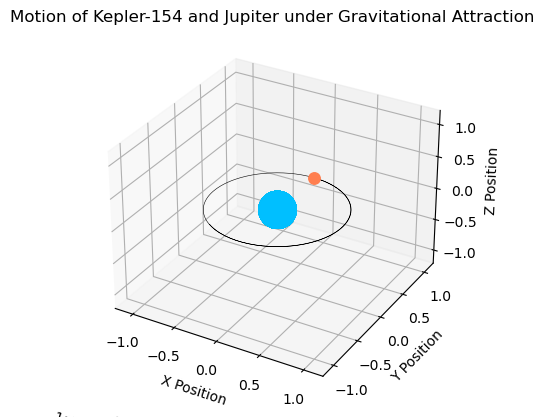

In [7]:
# Plot a 3D static orbit of Jupiter around a random star
Jupiter = HeavenlyBody('Jupiter', 'coral', const.M_jup.value, const.R_jup.value,
                       np.array([0, 5.2*const.au.value, 0]), np.array([0, 0, 0]))

Star = generate_random_star()

# Calculate the initial orbital velocity of Jupiter
Jupiter.velocity = np.array([calculate_orbital_velocity(Sun, Jupiter), 0, 0])

# Overestimate simulation length to ensure full orbit
plot_orbit(Star, Jupiter, jupiter_sun_period*1.5/30, plot_type='3D_static', dt=SEC_PER_DAY*30)

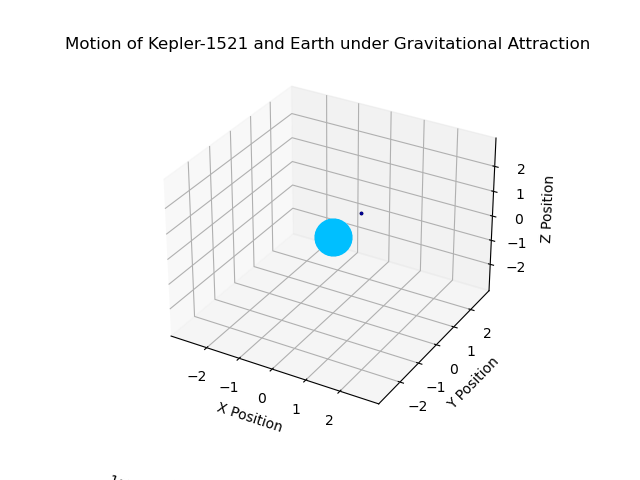

In [11]:
# Plot a 3D gif of the orbit of Earth around a random star
Earth = HeavenlyBody('Earth', 'darkblue', const.M_earth.value, const.R_earth.value,
                     np.array([0, const.au.value, 0]), np.array([0, 0, 0]))

Star = generate_random_star()

# Calculate the initial orbital velocity of Earth
Earth.velocity = np.array([calculate_orbital_velocity(Sun, Earth), 0, 0])

# Overestimate simulation length to ensure full orbit
plot_orbit(Star, Earth, earth_sun_period*1.5/5, plot_type='3D_gif', dt=SEC_PER_DAY*5)

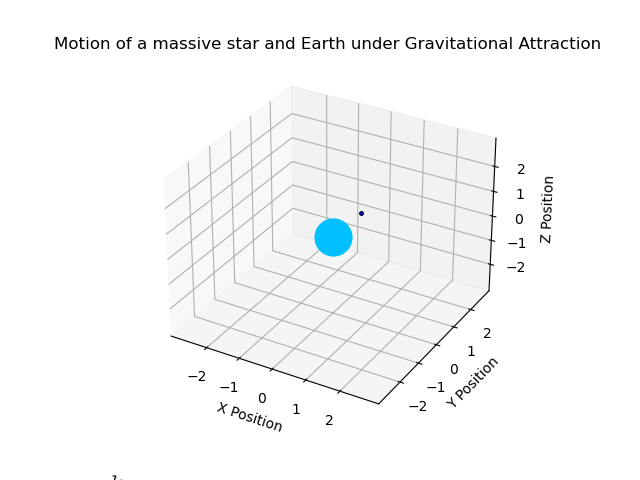

In [12]:
# Plot a 3D gif of the orbit of Earth around a massive star
Earth = HeavenlyBody('Earth', 'darkblue', const.M_earth.value, const.R_earth.value,
                     np.array([0, const.au.value, 0]), np.array([0, 0, 0]))

Star = generate_random_star()
Star.mass = Star.mass*2
Star.name = 'a massive star'

# Calculate the initial orbital velocity of Jupiter
Earth.velocity = np.array([calculate_orbital_velocity(Sun, Earth), 0, 0])

# Overestimate simulation length to ensure full orbit
plot_orbit(Star, Earth, earth_sun_period/5, plot_type='3D_gif', dt=SEC_PER_DAY*5)

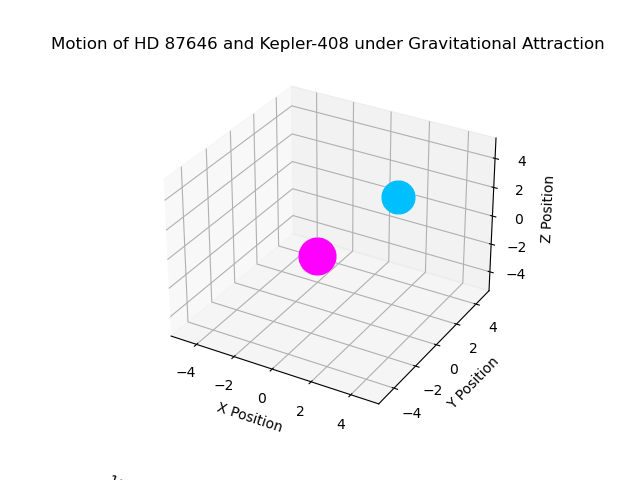

In [90]:
# Plot a 3D gif of two random stars gravitationally interacting
Star_1 = generate_random_star()
Star_1.position = -np.random.rand(3)*const.au.value
Star_1.velocity = np.random.rand(3)*10000
Star_1.color = 'magenta'


Star_2 = generate_random_star()
Star_2.position = np.random.rand(3)*const.au.value+const.au.value
Star_2.velocity = -np.random.rand(3)*10000

plot_orbit(Star_1, Star_2, 1.5*earth_sun_period/4, plot_type='3D_gif', dt=SEC_PER_DAY*4)